In [1]:
from Config import *
from Dataset import *
from Experiments import *
from Metric import *
from Model import *
from Utils import *
from FID import *
from Train import *

import gc
#import torchvision.transforms as T



class set_args:
    def __init__(self):
        self.seed = 5
        self.state = 'train'
        self.epochs = 30 # training epochs
        self.batch_size = 80
        self.dataset = 'Imagenet'#'MNIST'#'CIFAR10'#'Imagenet'#'LSUN_bedroom'
        self.test_dataset = ['MNIST','CIFAR10','Imagenet','LSUN_bedroom','AFHQ','STL-10','Imagenet']
        self.split_class= [0]

        #Load different model if TRUE
        self.model = 'CM' #'DDPM', #'CM'
        self.load_different_model = False
        
        # load trained model to continue training
        self.load_trained_model = False
        self.load_training_checkpoint = 30 #30,#250
        self.load_rd_training_checkpoint = 150

        self.sample_dir = 'Result'
        self.checkpoint_dir = 'Result'
        self.M = [0]
        self.I = [0]

        #Reduce training sample
        self.rd = 0.05
        self.training_anchor_num = 10 # training_anchor_num=300
        self.testing_anchor_num = 100 # testing_anchor_num=3000
        self.metric = 'L2'
        

        self.save_weight_dir = 'Result/CheckpointsMNIST/'

        
    
directory_init()

args = set_args()
seed_everything(args.seed) 


"""Merge both these"""
model_config = set_config(args, custom_dataset=args.dataset) 

model, sampler, trainer = model_init(args, model_config)

# FID

block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
InceptionV3_model = InceptionV3([block_idx])
InceptionV3_model=InceptionV3_model.cuda()



1.13.1
Config : Imagenet
Config : haha
loading model : c0_ckpt_30_.pt ......


c:\Users\user\Desktop\DDPM_XAI\Utils.py:801: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
update Sampler ...... done
update Trainer ...... done


c:\Users\user\.conda\envs\FID\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\user\.conda\envs\FID\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [2]:
import torch
from diffusers import ConsistencyModelPipeline

if args.model == 'CM':
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # 加載 Consistency Model
    model_id = "openai/diffusers-cd_imagenet64_lpips"
    #model_id = "openai/diffusers-cd_bedroom256_lpips"
    #model_id = "openai/diffusers-cd_cat256_lpips"


    pipe = ConsistencyModelPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
    pipe.to(device)


    num_samples = 80
    compare_samples = 5
    #batch_size = 80

    num_inference_steps = 6

    latents = None
    callback = None
    callback_steps = 1
    timesteps = None
    generator = None
    output_type = "pil"

    XLA_AVAILABLE = False

    img_size = pipe.unet.config.sample_size
    device = pipe._execution_device

    class_label = torch.tensor([415], device=device)

    model_output_dict = {}

    # 0. Prepare call parameters
    img_size = pipe.unet.config.sample_size
    device = pipe._execution_device

    # 1. Check inputs
    pipe.check_inputs(num_inference_steps, timesteps, latents, num_samples, img_size, callback_steps)

    # 2. Prepare image latents
    # Sample image latents x_0 ~ N(0, sigma_0^2 * I)
    sample = pipe.prepare_latents(
        batch_size=num_samples,
        num_channels=pipe.unet.config.in_channels,
        height=img_size,
        width=img_size,
        dtype=pipe.unet.dtype,
        device=device,
        generator=None,
        latents=latents,
    )

    # 3. Handle class_labels for class-conditional models
    class_labels = pipe.prepare_class_labels(num_samples, device, class_labels=class_label)

    # 4. Prepare timesteps
    if timesteps is not None:
        pipe.scheduler.set_timesteps(timesteps=timesteps, device=device)
        timesteps = pipe.scheduler.timesteps
        num_inference_steps = len(timesteps)
    else:
        pipe.scheduler.set_timesteps(num_inference_steps)
        timesteps = pipe.scheduler.timesteps

c:\Users\user\.conda\envs\FID\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s]


In [ ]:
class t_Experiment_1:
    def __init__(self, args, model_config, model, sampler, trainer):
        self.args = args
        self.device = model_config['device']
        self.model_config = model_config
        
        """Merge with _procedure function"""
        # None stands for unlimit
        self.test_lim_i = 80 
        self.train_lim_i = 80

        print("Creating anchor dataframe ......")
        """Initialize the config for the procedure"""
        if args.model == 'DDPM':
            self.test_t = [0, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 999]
            self.df_anchor = self._procedure_DDPM(model, sampler, trainer, args.training_anchor_num, args.testing_anchor_num)

        elif args.model == 'CM':
            self.test_t = pipe.scheduler.timesteps
            self.df_anchor = self._procedure_CM(pipe, args.training_anchor_num, args.testing_anchor_num)
        


        # Run
        #self.df_anchor = self._procedure(model, sampler, trainer, args.training_anchor_num, args.testing_anchor_num)
        print("Create anchor dataframe Done ......")

    def _procedure_DDPM(self, model, sampler, trainer, training_anchor_num=10, testing_anchor_num=10):
        """
        Still need some improvment for divided extrinsic and intrinsic 't'
        """
        
        
        data_idx = []
        label_lst = []
        ef_inversion_lst = []
        h_lst = []
        t_lst = []
        kld_lst = []
        is_train = []

        

        betas = trainer.betas
        alpha_t = 1.0 - betas
        alpha_cumprod = torch.cumprod(alpha_t, dim=0)
        
        #Function for adjusting weight to applying time step
        test_t_ext_w = 0
        test_t_int_w = 1

        with torch.no_grad():
            model.eval()
            noisyImage = torch.randn(
            size=[self.model_config["batch_size"], 3, 32, 32], device=self.device)
            saveNoisy = torch.clamp(noisyImage * 0.5 + 0.5, 0, 1)
            sampledImgs = sampler(noisyImage)

        x_tilde_0 = sampledImgs

        dt_train = CUSTOM_DATASET(self.args, split=True)
        train_dataset, _ = dt_train.load_dataset(custom_trasform=False)

        """
        CIFAR10_raw = CIFAR10(root='./CIFAR10_ds', train=False, download=True, transform=dataset_transform('32p'))

        MNIST_raw = MNIST(root='./MNIST_ds', train=True, download=True, transform=dataset_transform('32p_mnist'))
            
        #LSUN_raw = torchvision.datasets.ImageFolder(root='LSUN_bedroom/train', transform=Imagenet_DatasetTransform)
        
        AFHQ_raw = torchvision.datasets.ImageFolder(root='AFHQ/train', transform=dataset_transform('32p'))
        
        STL_raw = torchvision.datasets.ImageFolder(root='STL-10/train', transform=dataset_transform('32p'))

        Imagenet_raw = torchvision.datasets.ImageFolder(root='Imagenet/train', transform=dataset_transform('32p'))



        MNIST_test_dataset = FixedLabelDataset(MNIST_raw, 0)
        CIFAR10_test_dataset = FixedLabelDataset(CIFAR10_raw, 1)
        #LSUN_test_dataset = FixedLabelDataset(LSUN_raw, 2)
        AFHQ_test_dataset = FixedLabelDataset(AFHQ_raw, 3)
        STL_test_dataset = FixedLabelDataset(STL_raw, 4)
        Imagenet_test_dataset = FixedLabelDataset(Imagenet_raw, 5)
        """
        
        # 建立打亂的索引順序
        #combined_dataset = torch.utils.data.ConcatDataset([MNIST_test_dataset, CIFAR10_test_dataset, LSUN_test_dataset, AFHQ_test_dataset, STL_test_dataset, Imagenet_test_dataset])
        #combined_dataset = torch.utils.data.ConcatDataset([MNIST_test_dataset, CIFAR10_test_dataset, AFHQ_test_dataset, STL_test_dataset, Imagenet_test_dataset])
        combined_dataset = create_combined_dataset(args, pixel='32')


        #combined_dataset = torch.utils.data.ConcatDataset([LSUN_test_dataset])

        shuffled_indices = list(range(len(combined_dataset)))
        random.shuffle(shuffled_indices)


        # 包裝成一個新的 shuffled dataset
        test_dataset = ShuffledDataset(combined_dataset, shuffled_indices)


        with torch.no_grad():
            for test_t in self.test_t:
                test_t_ext = int(test_t * test_t_ext_w)
                test_t_int = int(test_t * test_t_int_w) 

                x_tilde_noise_map = []
                x_tilde_h_map = []
                
                for i in range(len(x_tilde_0)):
                    x_0_train = x_tilde_0[i].to(self.device)
                    ef_inversion_val = edit_friendly_inversion(x_0_train, test_t_ext, alpha_cumprod, model, sampler)
                
                    # h space
                    base_n_t_h = x_0_train.new_ones([1, ], dtype=torch.long) * test_t_int
                    h_train = model(x_0_train.unsqueeze(dim=0), base_n_t_h)
                    
                    # append 
                    x_tilde_noise_map.append(ef_inversion_val)
                    x_tilde_h_map.append(h_train)
                    if i == 79:
                        break
                
                x_tilde_noise_map = torch.stack(x_tilde_noise_map)
                x_tilde_h_map = torch.stack(x_tilde_h_map)
                
                for i, (img, label) in enumerate(test_dataset):
                    x_0 = test_dataset[i][0].to(self.device)

                    ef_inversion_val = edit_friendly_inversion(x_0, test_t_ext, alpha_cumprod, model, sampler)

                    h_test = model(x_0.unsqueeze(dim=0), base_n_t_h)
                    
                    label_lst.append(str(label))

                    t_lst.append(test_t)

                    mse_loss = nn.MSELoss()
                    kld_loss = nn.KLDivLoss(reduction='batchmean')

                    mse_diff = 0
                    h_diff = 0
                    kld_diff = 0

                    input_t = F.log_softmax(ef_inversion_val.unsqueeze(dim=0), dim=1)
                    target_t = F.softmax(x_tilde_noise_map, dim=1)
                    kld_diff = kld_loss(input_t, target_t)



                    for j in range(x_tilde_noise_map.shape[0]):
                        mse_diff += compute_edit_distance(ef_inversion_val * 100, x_tilde_noise_map[j] * 100, 'mse') / (x_tilde_noise_map.shape[0])
                        h_diff += compute_edit_distance(h_test, x_tilde_h_map[j], 'mse') / (x_tilde_noise_map.shape[0])
                    
                    ef_inversion_lst.append(round(float((mse_diff.cpu().numpy())), 4))
                    h_lst.append(round(float(h_diff.cpu().numpy()), 4))
                    kld_lst.append(round(float(kld_diff.cpu().numpy()), 4))
                    data_idx.append(int(i))
                    is_train.append(False)
                    
                    
                    
                    if i == self.args.testing_anchor_num:
                        break


                for i, (img, label) in enumerate(train_dataset):
                    x_0 = train_dataset[i][0].to(self.device)

                    ef_inversion_val = edit_friendly_inversion(x_0, test_t_ext, alpha_cumprod, model, sampler)

                    h_test = model(x_0.unsqueeze(dim=0), base_n_t_h)
                    
                    label_lst.append('train')

                    t_lst.append(test_t)

                    mse_loss = nn.MSELoss()
                    kld_loss = nn.KLDivLoss(reduction='batchmean')

                    mse_diff = 0
                    h_diff = 0
                    kld_diff = 0

                    input_t = F.log_softmax(ef_inversion_val.unsqueeze(dim=0), dim=1)
                    target_t = F.softmax(x_tilde_noise_map, dim=1)
                    kld_diff = kld_loss(input_t, target_t)

                    for j in range(x_tilde_noise_map.shape[0]):
                        mse_diff += compute_edit_distance(ef_inversion_val * 100, x_tilde_noise_map[j] * 100, 'mse') / (x_tilde_noise_map.shape[0])
                        h_diff += compute_edit_distance(h_test, x_tilde_h_map[j], 'mse') / (x_tilde_noise_map.shape[0])
                    
                    ef_inversion_lst.append(round(float((mse_diff.cpu().numpy())), 4))
                    h_lst.append(round(float(h_diff.cpu().numpy()), 4))
                    kld_lst.append(round(float(kld_diff.cpu().numpy()), 4))
                    data_idx.append(int(i))
                    is_train.append(True)
                    
                    
                    if i == self.args.training_anchor_num:
                        break

            
            
        df_anchor = pd.DataFrame([data_idx, is_train, label_lst, t_lst, ef_inversion_lst, h_lst, kld_lst]).T
        df_anchor.columns = ['idx', 'is_train', 'label', 't', 'ef_inversion', 'h', 'kld']
        
        # Create a MinMaxScaler instance
        scaler = MinMaxScaler()

        # Apply min-max scaling to ef_inversion within each group of t
        df_anchor['scaled_ef_inversion'] = df_anchor.groupby('t')['ef_inversion'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )
        df_anchor['scaled_h'] = df_anchor.groupby('t')['h'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )
        df_anchor['scaled_kld'] = df_anchor.groupby('t')['kld'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )



        return df_anchor
    
    def _procedure_CM(self, pipe, training_anchor_num=500, testing_anchor_num=500):
        """
        Still need some improvment for divided extrinsic and intrinsic 't'
        """
        
        sample = pipe.prepare_latents(
            batch_size=num_samples,
            num_channels=pipe.unet.config.in_channels,
            height=img_size,
            width=img_size,
            dtype=pipe.unet.dtype,
            device=device,
            generator=None,
            latents=latents,
        )
        
        data_idx = []
        label_lst = []
        ef_inversion_lst = []
        h_lst = []
        t_lst = []
        kld_lst = []
        is_train = []


        mu_q_lst = []
        sigma_q_lst = []
        mu_p_lst = []
        sigma_p_lst = []

        betas = trainer.betas
        alpha_t = 1.0 - betas
        alpha_cumprod = torch.cumprod(alpha_t, dim=0)
        
        #Function for adjusting weight to applying time step
        test_t_ext_w = 0
        test_t_int_w = 1
            
        # Convert to tensor in range [-1, 1]
        preprocess = transforms.Compose([
            transforms.Resize((64,64)),
            transforms.ToTensor(),
            #T.Normalize([0.5]*3, [0.5]*3)
        ])
            
        with torch.no_grad(): 
            """
            for _ in range(num_samples):
                image = pipe(num_inference_steps=None, timesteps=[10, 0], class_labels=1).images[0]
                image_tensor = preprocess(image).unsqueeze(0).to(model_config['device'])

                gen_images.append(image_tensor[0])
            """
            
            
            gen_images = []
            # 5. Denoising loop
            # Multistep sampling: implements Algorithm 1 in the paper
            with pipe.progress_bar(total=num_inference_steps) as progress_bar:
                for i, t in enumerate(self.test_t):
                    scaled_sample = pipe.scheduler.scale_model_input(sample, t)
                    model_output = pipe.unet(scaled_sample, t, class_labels=class_labels, return_dict=False)[0]
                    model_output_dict[i] = model_output
                    
                    sample = pipe.scheduler.step(model_output, t, sample, generator=generator)[0]
            
                    # call the callback, if provided
                    progress_bar.update()

                # 6. Post-process image sample
                image = pipe.postprocess_image(sample, output_type=output_type)
                
                for n_s in range(num_samples):
                    image_tensor = preprocess(image[n_s]).unsqueeze(0).to(model_config['device'])
                    gen_images.append(image_tensor[0])
            
            sampledImgs = torch.stack(gen_images, dim=0)

            # Offload all models
            pipe.maybe_free_model_hooks()
                
            
            

        x_tilde_0 = sampledImgs

        dt_train = CUSTOM_DATASET(self.args, split=True)
        train_dataset, _ = dt_train.load_dataset(custom_trasform=False)
      

        dt_train = CUSTOM_DATASET(args, split=True)
        train_dataset, _ = dt_train.load_dataset(custom_trasform=False)

        
   
        """
        CIFAR10_raw = CIFAR10(root='./CIFAR10_ds', train=False, download=True, transform=dataset_transform('64p'))

        MNIST_raw = MNIST(root='./MNIST_ds', train=True, download=True, transform=dataset_transform('64p_mnist'))
            
        LSUN_raw = torchvision.datasets.ImageFolder(root='LSUN_bedroom/train', transform=dataset_transform('64p'))
        
        AFHQ_raw = torchvision.datasets.ImageFolder(root='AFHQ/train', transform=dataset_transform('64p'))
        
        STL_raw = torchvision.datasets.ImageFolder(root='STL-10/train', transform=dataset_transform('64p'))
        
        #Imagenet_raw = torchvision.datasets.ImageFolder(root='Imagenet/train', transform=Imagenet_DatasetTransform)



        MNIST_test_dataset = FixedLabelDataset(MNIST_raw, 0)
        CIFAR10_test_dataset = FixedLabelDataset(CIFAR10_raw, 1)
        LSUN_test_dataset = FixedLabelDataset(LSUN_raw, 2)
        AFHQ_test_dataset = FixedLabelDataset(AFHQ_raw, 3)
        STL_test_dataset = FixedLabelDataset(STL_raw, 4)
        #Imagenet_test_dataset = FixedLabelDataset(Imagenet_raw, 5)
        """
        # 建立打亂的索引順序
        #combined_dataset = torch.utils.data.ConcatDataset([MNIST_test_dataset, CIFAR10_test_dataset, LSUN_test_dataset, AFHQ_test_dataset, STL_test_dataset, Imagenet_test_dataset])
        #combined_dataset = torch.utils.data.ConcatDataset([MNIST_test_dataset, CIFAR10_test_dataset, LSUN_test_dataset, AFHQ_test_dataset, STL_test_dataset])
        #combined_dataset = torch.utils.data.ConcatDataset([LSUN_test_dataset])

        combined_dataset = create_combined_dataset(args, pixel='64')
        
        shuffled_indices = list(range(len(combined_dataset)))
        random.shuffle(shuffled_indices)


        # 包裝成一個新的 shuffled dataset
        test_dataset = ShuffledDataset(combined_dataset, shuffled_indices)

        with torch.no_grad():
            features = {}

            def hook(module, input, output):
                features["mid_block"] = output
                
            hook_handle = pipe.unet.mid_block.register_forward_hook(hook)
            for n_t, test_t in enumerate(self.test_t):
                test_t_ext = test_t * test_t_ext_w
                test_t_int = test_t * test_t_int_w

                x_tilde_noise_map = []
                x_tilde_h_map = []
                
                for i in range(len(x_tilde_0)):
                    if i == 80:
                        break
                    x_0_train = x_tilde_0[i].to(self.device)
                    #ef_inversion_val = edit_friendly_inversion(x_0_train, test_t_ext, alpha_cumprod, model, sampler)
                
                    # h space
                    
                    image_scaled = x_0_train.unsqueeze(0).half()
                    
                    # no intialize class label for the model
                    if args.dataset == 'LSUN_bedroom':
                        pred_noise = pipe.unet(image_scaled, test_t).sample
                        
                    else:
                        pred_noise = pipe.unet(
                            image_scaled, test_t, class_labels=torch.tensor([1]).to(model_config['device'])
                        ).sample
                    """
                    
                    pred_noise = pipe.unet(
                        image_scaled, test_t
                    ).sample
                    """
                    """
                    
                    noisy_image = pipe.scheduler.add_noise(gen_dt.unsqueeze(0), torch.randn_like(gen_dt), t.unsqueeze(0)).half()
                    noisy_image_scaled = min_max_scaler(noisy_image)

                    pred_noise = pipe.unet(
                        noisy_image_scaled, t, class_labels=torch.tensor([1]).to(model_config['device'])
                    ).sample
                    """
                    
                    # 正常呼叫 UNet
                    if args.dataset == 'LSUN_bedroom':
                        output = pipe.unet(pred_noise, test_t)
                    else:
                        output = pipe.unet(pred_noise, test_t, class_label)
                    #output = pipe.unet(pred_noise, test_t)


                    mid_block_output = features["mid_block"]
                    
                    #base_n_t_h = x_0_train.new_ones([1, ], dtype=torch.long) * test_t_int
                    #h_train = model(x_0_train.unsqueeze(dim=0), base_n_t_h)
                    h_train = mid_block_output
                    
                    
                    # append 
                    #x_tilde_noise_map.append(ef_inversion_val)
                    x_tilde_noise_map.append(x_0_train)
                    x_tilde_h_map.append(h_train)
                    
                
                x_tilde_noise_map = torch.stack(x_tilde_noise_map)
                x_tilde_h_map = torch.stack(x_tilde_h_map)
                
                for i, (img, label) in enumerate(test_dataset):
                    if i == testing_anchor_num + 1:
                        break
                    x_0 = test_dataset[i][0].unsqueeze(0).half().to(self.device)
                     
                    if args.dataset == 'LSUN_bedroom':
                        pred_noise = pipe.unet(x_0, test_t).sample
                        
                    else:
                        pred_noise = pipe.unet(
                            x_0, test_t, class_labels=torch.tensor([1]).to(model_config['device'])
                        ).sample
                    """
                    pred_noise = pipe.unet(
                        x_0, test_t
                    ).sample
                    """
                    #x_tilde_t = trainer.get_step_xt(x_tilde_0, test_t)
                    #timesteps = list(range(1000))
                    
                    #ef_inversion_val = edit_friendly_inversion(x_0, test_t_ext, alpha_cumprod, model, sampler)
                    ef_inversion_val = x_0.squeeze(dim=0)

                    #h_test = model(x_0.unsqueeze(dim=0), base_n_t_h)
                    

                    # 正常呼叫 UNet
                    if args.dataset == 'LSUN_bedroom':
                        output = pipe.unet(pred_noise, test_t)
                    else:
                        output = pipe.unet(pred_noise, test_t, class_label)
                    #output = pipe.unet(pred_noise, test_t)

                    mid_block_output = features["mid_block"]
                    
                    h_test = mid_block_output
                    
                    #print(kl_div_pixelwise.mean().cpu().numpy(), test_dataset[i][1])
                    label_lst.append(str(label))
                    #kld_lst.append(float(kl_div_pixelwise.mean().cpu().numpy()))
                    #h_lst.append(h_diff)
                    t_lst.append(n_t)

                    mse_loss = nn.MSELoss()
                    kld_loss = nn.KLDivLoss(reduction='batchmean')

                    mse_diff = 0
                    h_diff = 0
                    kld_diff = 0

                    input_t = F.log_softmax(ef_inversion_val.unsqueeze(dim=0), dim=1)
                    target_t = F.softmax(x_tilde_noise_map, dim=1)
                    kld_diff = kld_loss(input_t, target_t)



                    for j in range(x_tilde_noise_map.shape[0]):
                        mse_diff += compute_edit_distance(ef_inversion_val * 100, x_tilde_noise_map[j] * 100, 'mse') / (x_tilde_noise_map.shape[0])
                        h_diff += compute_edit_distance(h_test, x_tilde_h_map[j], 'mse') / (x_tilde_noise_map.shape[0])
                    
                    ef_inversion_lst.append(round(float((mse_diff.cpu().numpy())), 4))
                    h_lst.append(round(float(h_diff.cpu().numpy()), 4))
                    kld_lst.append(round(float(kld_diff.cpu().numpy()), 4))
                    data_idx.append(int(i))
                    is_train.append(False)
                    
                    
                    ##mu_q_lst.append(round(float((mu_q.cpu().numpy())), 4))
                    #sigma_q_lst.append(round(float((sigma_q.cpu().numpy())), 4))
                    ##mu_p_lst.append(round(float((mu_p.cpu().numpy())), 4))
                    #sigma_p_lst.append(round(float((sigma_p.cpu().numpy())), 4))
                    
                    
                    


                for i, (img, label) in enumerate(train_dataset):
                    if i == training_anchor_num + 1:
                        break
                    x_0 = train_dataset[i][0].unsqueeze(0).half().to(self.device)
                    
                    
                    if args.dataset == 'LSUN_bedroom':
                        pred_noise = pipe.unet(x_0, test_t).sample
                        
                    else:
                        pred_noise = pipe.unet(
                            x_0, test_t, class_labels=torch.tensor([1]).to(model_config['device'])
                        ).sample
                    
                    """
                    pred_noise = pipe.unet(
                        x_0, test_t
                    ).sample
                    """
                    #x_tilde_t = trainer.get_step_xt(x_tilde_0, test_t)
                    #timesteps = list(range(1000))
                    
                    
                    #ef_inversion_val = edit_friendly_inversion(x_0, test_t_ext, alpha_cumprod, model, sampler)
                    ef_inversion_val = x_0.squeeze(dim=0)

                    #h_test = model(x_0.unsqueeze(dim=0), base_n_t_h)
    

                    # 正常呼叫 UNet
                    if args.dataset == 'LSUN_bedroom':
                        output = pipe.unet(pred_noise, test_t)
                    else:
                        output = pipe.unet(pred_noise, test_t, class_label)
                    #output = pipe.unet(pred_noise, test_t)

                    mid_block_output = features["mid_block"]

                    
                    #base_n_t_h = x_0_train.new_ones([1, ], dtype=torch.long) * test_t_int
                    #h_train = model(x_0_train.unsqueeze(dim=0), base_n_t_h)
                    h_test = mid_block_output
                    
                    
                    #print(kl_div_pixelwise.mean().cpu().numpy(), test_dataset[i][1])
                    label_lst.append('train')
                    #kld_lst.append(float(kl_div_pixelwise.mean().cpu().numpy()))
                    #h_lst.append(h_diff)
                    t_lst.append(n_t)

                    mse_loss = nn.MSELoss()
                    kld_loss = nn.KLDivLoss(reduction='batchmean')

                    mse_diff = 0
                    h_diff = 0
                    kld_diff = 0

                    input_t = F.log_softmax(ef_inversion_val.unsqueeze(dim=0), dim=1)
                    target_t = F.softmax(x_tilde_noise_map, dim=1)
                    kld_diff = kld_loss(input_t, target_t)

                    for j in range(x_tilde_noise_map.shape[0]):
                        mse_diff += compute_edit_distance(ef_inversion_val * 100, x_tilde_noise_map[j] * 100, 'mse') / (x_tilde_noise_map.shape[0])
                        h_diff += compute_edit_distance(h_test, x_tilde_h_map[j], 'mse') / (x_tilde_noise_map.shape[0])
                    
                    ef_inversion_lst.append(round(float((mse_diff.cpu().numpy())), 4))
                    h_lst.append(round(float(h_diff.cpu().numpy()), 4))
                    kld_lst.append(round(float(kld_diff.cpu().numpy()), 4))
                    data_idx.append(int(i))
                    is_train.append(True)
                    
                    
        hook_handle.remove()

            
            
        df_anchor = pd.DataFrame([data_idx, is_train, label_lst, t_lst, ef_inversion_lst, h_lst, kld_lst]).T
        df_anchor.columns = ['idx', 'is_train', 'label', 't', 'ef_inversion', 'h', 'kld']
        
        # Create a MinMaxScaler instance
        scaler = MinMaxScaler()

        # Apply min-max scaling to ef_inversion within each group of t
        df_anchor['scaled_ef_inversion'] = df_anchor.groupby('t')['ef_inversion'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )
        df_anchor['scaled_h'] = df_anchor.groupby('t')['h'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )
        df_anchor['scaled_kld'] = df_anchor.groupby('t')['kld'].transform(
            lambda x: scaler.fit_transform(x.values.reshape(-1, 1)).flatten()
        )



        return df_anchor
        

    def plot_sim(self):

        label_map = {
            '0': 'MNIST',
            '1': 'CIFAR10',
            '2': 'LSUN-bedroom',
            '3': 'AFHQ',
            '4': 'STL-10',
            '5': 'Imagenet',
            'train': 'train'
        }
        
        #hue_order = ['0', '1', '2', '3', '4', '5', 'train']  # 保持原本順序不變（根據 df 中實際值）
        hue_order = sorted(self.df_anchor['label'].unique())

        palette = {
            '0': 'red',
            '1': 'green',
            '2': 'orange',
            '3': 'purple',
            '4': 'pink',
            '5': 'brown',
            'train': 'blue'
        }


        fig, axes = plt.subplots(2, 1, figsize=(6, 12))  # Adjust figure size as needed

        sns.lineplot(ax=axes[0], data=self.df_anchor, x='t',y='scaled_ef_inversion',hue='label', hue_order=hue_order, palette=palette)
        axes[0].set_ylabel('Timestep')
        axes[0].set_ylabel('Extrinsic')
        handles, labels = axes[0].get_legend_handles_labels()
        mapped_labels = [label_map.get(label, label) for label in labels]
        
        axes[0].legend(handles, mapped_labels, loc='upper left', bbox_to_anchor=(1, 1))
        axes[0].set_xticks(list(range(0, self.df_anchor['t'].max()+1, (self.df_anchor['t'].max()+1)//5)))

        #axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[0].set_title(f'Extrinsic at each timestep{self.args.dataset,self.args.split_class}')
        
        plt.savefig(f'Result/Results{self.args.dataset}/ef_inversion_{self.args.dataset}_{self.args.split_class}.png')

        sns.lineplot(ax=axes[1], data=self.df_anchor, x='t',y='scaled_h',hue='label', hue_order=hue_order, palette=palette)
        
        handles, labels = axes[0].get_legend_handles_labels()
        mapped_labels = [label_map.get(label, label) for label in labels]
        
        axes[1].legend(handles, mapped_labels, loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[1].set_xticks(list(range(0, self.df_anchor['t'].max()+1, self.df_anchor['t'].max()//5)))
        axes[1].set_ylabel('Timestep')
        axes[1].set_ylabel('Intrinsic')

        #axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[1].set_title(f'Intrinsic at each timestep{self.args.dataset,self.args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/scaled_h_{self.args.dataset}_{self.args.split_class}.png')

Creating anchor dataframe ......


  0%|          | 0/6 [00:00<?, ?it/s]

c:\Users\user\.conda\envs\FID\lib\site-packages\diffusers\models\attention_processor.py:3286: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 6/6 [00:01<00:00,  3.67it/s]


Files already downloaded and verified
Create anchor dataframe Done ......
Experiment 1 Done ......


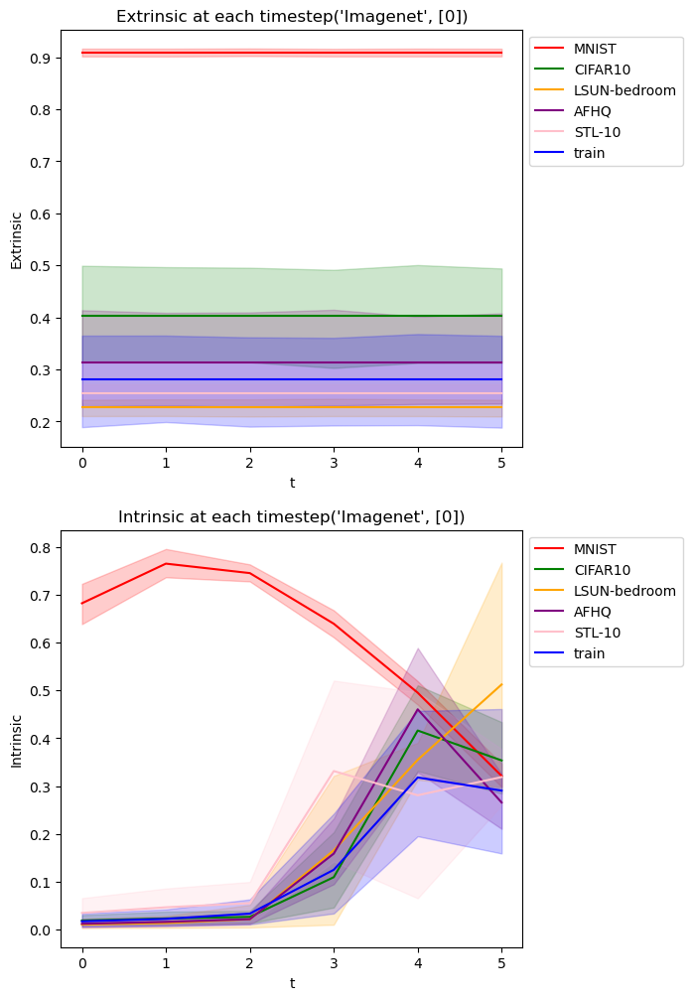

In [ ]:
expriment1 = t_Experiment_1(args, model_config, model, sampler, trainer)
expriment1.plot_sim()
expriment1.df_anchor
df_anchor = 

print("Experiment 1 Done ......")

In [18]:
class t_Experiment_2:
    """Calculate Frechet Distance"""
    def __init__(self, args, model_config, experiment_1_df, metric):
        self.args = args
        self.metric = metric
        self.exp1_df = experiment_1_df.copy()
        df_istrain = experiment_1_df[experiment_1_df['is_train'] == True]
        df_istest = experiment_1_df[experiment_1_df['is_train'] == False]
        #df_is_0 = df_istest[df_istest['label'] == '0']
        #df_is_1 = df_istest[df_istest['label'] == '1']
        #df_is_2 = df_istest[df_istest['label'] == '2']
        #df_is_3 = df_istest[df_istest['label'] == '3']
        #df_is_4 = df_istest[df_istest['label'] == '4']
        #df_is_5 = df_istest[df_istest['label'] == '5']
        #df_is_6 = df_istest[df_istest['label'] == '6']
        #df_is_7 = df_istest[df_istest['label'] == '7']
        #df_is_8 = df_istest[df_istest['label'] == '8']
        #df_is_9 = df_istest[df_istest['label'] == '9']
        
        (
            self.anchor_train_mean_df,
            self.i_mean,
            self.i_var,
            self.e_mean,
            self.e_var
        ) = self._calc_asc_weight_df(df_istrain, df_istrain, metric=metric)
        
        self.anchor_test_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_istest, df_istrain,metric=metric)
        #self.anchor_test0_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_0, df_istrain,metric=metric)
        #self.anchor_test1_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_1, df_istrain,metric=metric)
        #self.anchor_test2_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_2, df_istrain,metric=metric)
        #self.anchor_test3_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_3, df_istrain,metric=metric)

        
   
    
    def plot_sim(self):
        args = self.args

        palette = {
            str(i): 'red' if str(i) == str(args.split_class[0]) else 'grey'
            for i in range(10)
        }
        #palette['train'] = 'blue'  # Adding 'train' key separately
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']

        concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test_mean_df],axis=0).reset_index()
        concat_df['label_group'] = concat_df['label'].apply(lambda x: 'train' if x == 'train' else 'other')

    # 設定顏色
        palette = {'train': 'blue', 'other': 'grey'}
        hue_order = ['train', 'other']
        #concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test1_mean_df],axis=0).reset_index()


        fig, axes = plt.subplots(3, 1, figsize=(6, 18))  # Adjust figure size as needed

        sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
        axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[0].set_title(f'{self.metric} distance of scaled intrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/{self.metric}_h_{self.args.dataset}_{self.args.split_class}.png')


        #hue_order = ['0','1','2','3','4','5','6','7','8','9']
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']

        sns.boxplot(ax=axes[1], data=concat_df, x='label_group',y='fd_ef', hue_order=hue_order, palette=palette, order=hue_order)
        axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[1].set_title(f'{self.metric} distance of scaled extrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/{self.metric}_ex_{self.args.dataset}_{self.args.split_class}.png')

        sns.scatterplot(data=concat_df, x="fd_ef", y="fd_h", hue="label_group", palette=palette)
        axes[2].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[2].set_title(f'Quadrant plot of anchor {args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/scatter_plot_{self.metric}_{self.args.dataset}_{self.args.split_class}.png')
        
    def plot_sim_divide_dataset(self):
        args = self.args

        palette = {
            str(i): 'red' if str(i) == str(args.split_class[0]) else 'grey'
            for i in range(10)
        }
        #palette['train'] = 'blue'  # Adding 'train' key separately
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']
        
        label_map = {
            '0': 'MNIST',
            '1': 'CIFAR10',
            '2': 'LSUN-bedroom',
            '3': 'AFHQ',
            '4': 'STL-10',
            'train': 'train'
        }

        concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test_mean_df],axis=0).reset_index()
        concat_df['label_group'] = concat_df['label'].map(label_map).fillna('other')

    # 設定顏色
        #palette = {'train': 'blue', 'other': 'grey'}
        #hue_order = ['train', 'other']
        #concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test1_mean_df],axis=0).reset_index()


        fig, axes = plt.subplots(3, 1, figsize=(6, 18))  # Adjust figure size as needed

        sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order='label_group')
        axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[0].set_title(f'{self.metric} distance of scaled intrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/divide_{self.metric}_h_{self.args.dataset}_{self.args.split_class}.png')


        #hue_order = ['0','1','2','3','4','5','6','7','8','9']
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']

        sns.boxplot(ax=axes[1], data=concat_df, x='label_group',y='fd_ef', hue_order='label_group')
        axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[1].set_title(f'{self.metric} distance of scaled extrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/divide_{self.metric}_ex_{self.args.dataset}_{self.args.split_class}.png')

        sns.scatterplot(data=concat_df, x="fd_ef", y="fd_h", hue="label_group")
        axes[2].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[2].set_title(f'Quadrant plot of anchor {args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/divide_scatter_plot_{self.metric}_{self.args.dataset}_{self.args.split_class}.png')

        
    def _calc_asc_weight_df(self, input_df, compared_df, set_compare_num=80, metric='L2'):
        fd_h_lst = []
        fd_ef_lst = []
        label_lst = []
        compare_t = input_df['t'].unique()
        input_df = input_df.sort_values(by=['label'])

        #num_train = len(input_df['idx'].unique())

        #calculate training data
        anchor_cnt = 0
        anchor_set = []


        for i in input_df['idx'].unique():
            anchor_cnt += 1
            anchor_set.append(i)
            
            if anchor_cnt < 1:
                continue 
            
            
            anchor_cnt = 0

            fd_h = 0
            fd_ef = 0

            df_istrain_i = input_df[input_df['idx'].isin(anchor_set)].groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
            is_train_i_h_arr = np.array(df_istrain_i['scaled_h'])
            is_train_i_ef_arr = np.array(df_istrain_i['scaled_ef_inversion'])
            compare_h_P = np.vstack([compare_t, is_train_i_h_arr]).T
            compare_ef_P = np.vstack([compare_t, is_train_i_ef_arr]).T

            #for counter, j in enumerate(compared_df['idx'].unique()):
                #if counter > set_compare_num:
                    #break
            
            df_istrain_j = compared_df.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
            
            #df_istrain_j = compared_df[compared_df['idx']==j]
            is_train_j_h_arr = np.array(df_istrain_j['scaled_h'])
            is_train_j_ef_arr = np.array(df_istrain_j['scaled_ef_inversion'])
            compare_h_Q = np.vstack([compare_t, is_train_j_h_arr]).T
            compare_ef_Q = np.vstack([compare_t, is_train_j_ef_arr]).T
            
            fd_h += self._distance_metric(compare_h_P, compare_h_Q, metric=metric) / set_compare_num
            fd_ef += self._distance_metric(compare_ef_P, compare_ef_Q, metric=metric) / set_compare_num


            fd_h_lst.append(fd_h)
            fd_ef_lst.append(fd_ef)
            label_lst.append(input_df.iloc[i].label)
            anchor_set = []
            
        i_star = np.argmin(fd_h_lst)
        self._save_i_starImg(i_star)
         #calculate training data
        for i in [i_star]:
            i_star_i = []
            i_star_e = []

            df_istrain_i = input_df[input_df['idx']==i]
            is_train_i_h_arr = np.array(df_istrain_i['scaled_h'])
            is_train_i_ef_arr = np.array(df_istrain_i['scaled_ef_inversion'])
            compare_h_P = np.vstack([compare_t, is_train_i_h_arr]).T
            compare_ef_P = np.vstack([compare_t, is_train_i_ef_arr]).T

            #for counter, j in enumerate(compared_df['idx'].unique()):
                #if counter > set_compare_num:
                    #break

            df_istrain_j = compared_df.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
   
            #df_istrain_j = compared_df[compared_df['idx']==j]
            is_train_j_h_arr = np.array(df_istrain_j['scaled_h'])
            is_train_j_ef_arr = np.array(df_istrain_j['scaled_ef_inversion'])
            compare_h_Q = np.vstack([compare_t, is_train_j_h_arr]).T
            compare_ef_Q = np.vstack([compare_t, is_train_j_ef_arr]).T
            
            i_star_i.append(self._distance_metric(compare_h_P, compare_h_Q, metric=metric))
            i_star_e.append(self._distance_metric(compare_ef_P, compare_ef_Q, metric=metric))
        
        i_mean = np.mean(i_star_i)
        i_var = np.var(i_star_i)
        e_mean = np.mean(i_star_e)
        e_var = np.var(i_star_e)

        input_df_mean = input_df.groupby(['idx','label'])[['scaled_h','scaled_ef_inversion']].mean().reset_index()
        fd_df = pd.DataFrame([fd_h_lst, fd_ef_lst]).T
        fd_df.columns = ['fd_h','fd_ef']
        anchor_mean_df = pd.concat([input_df_mean,fd_df],axis=1)

        return anchor_mean_df, i_mean, i_var, e_mean, e_var

    def _euclidean(self, p1, p2):
        return np.linalg.norm(np.array(p1) - np.array(p2))

    def _frechet_recursive(self, ca, P, Q, i, j):
        if ca[i, j] > -1:
            return ca[i, j]
        elif i == 0 and j == 0:
            ca[i, j] = self._euclidean(P[0], Q[0])
        elif i > 0 and j == 0:
            ca[i, j] = max(self._frechet_recursive(ca, P, Q, i-1, 0), self._euclidean(P[i], Q[0]))
        elif i == 0 and j > 0:
            ca[i, j] = max(self._frechet_recursive(ca, P, Q, 0, j-1), self._euclidean(P[0], Q[j]))
        elif i > 0 and j > 0:
            ca[i, j] = max(min(self._frechet_recursive(ca, P, Q, i-1, j),
                            self._frechet_recursive(ca, P, Q, i-1, j-1),
                            self._frechet_recursive(ca, P, Q, i, j-1)),
                        self._euclidean(P[i], Q[j]))
        else:
            ca[i, j] = float('inf')
        return ca[i, j]

    def _frechet_distance(self, P, Q):
        ca = np.ones((len(P), len(Q))) * -1
        return self._frechet_recursive(ca, P, Q, len(P)-1, len(Q)-1)
    
    def _distance_metric(self, P, Q, metric):
        """
        Compute the distance between two sequences using various distance metrics.

        Parameters:
            P (np.array): First sequence
            Q (np.array): Second sequence
            metric (str): The distance metric to use. Options:
                        - 'L1' (Manhattan Distance)
                        - 'L2' (Euclidean Distance)
                        - 'Linf' (Chebyshev Distance)
                        - 'Frechet' (Frechet Distance)

        Returns:
            float: Computed distance
        """
        P, Q = np.array(P), np.array(Q)  # Ensure NumPy arrays
        
        if metric == 'L1':  # Manhattan Distance
            return np.sum(np.abs(P - Q))
        
        elif metric == 'L2':  # Euclidean Distance
            return np.sqrt(np.sum((P - Q) ** 2))
        
        elif metric == 'Linf':  # Chebyshev Distance (Maximum Norm)
            return np.max(np.abs(P - Q))
        
        elif metric == 'Frechet':  # Frechet Distance (assuming implemented)
            return self._frechet_distance(P, Q)
        
        else:
            raise ValueError(f"Unknown metric: {metric}. Choose from 'L1', 'L2', 'Linf', or 'Frechet'.")
    
    def _save_i_starImg(self, i_star):
        dt_train = CUSTOM_DATASET(self.args, split=True)
        train_dataset, _ = dt_train.load_dataset(custom_trasform=True)
        #plt.imshow(train_dataset[i_star][0].permute(1,2,0))
        #plt.savefig(f'Result/Results{self.args.dataset}/istar_{self.args.metric}_{self.args.dataset}_{self.args.split_class}.png')

In [19]:
class t_Experiment_3:
    def __init__(self, args, model_config, exp_train_df, exp_test_df):
        self.args = args
        self.df_train = exp_train_df.copy()
        self.df_test = exp_test_df.copy()
        
    def plot(self, KDE_plot=False):
        self._procedure(self.df_train, self.df_test, KDE_plot)  
        
    def _procedure(self, df_train, df_test, KDE_plot):
        # Define the palette
        args = self.args
        
        palette = {'train': 'blue', 'other': 'grey'}
        hue_order = ['train', 'other']

        # Concatenating DataFrames
        concat_df = pd.concat([df_train, df_test], axis=0).reset_index()
        concat_df['label_group'] = concat_df['label'].apply(lambda x: 'train' if x == 'train' else 'other')
        concat_df['w'] = concat_df['fd_h'] * 0.5 + concat_df['fd_ef'] * 0.5

        # Create subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Boxplot
        sns.boxplot(ax=axes[0], data=concat_df, x='label_group', y='w', hue='label_group', order=hue_order, palette=palette)
        axes[0].set_title(f'Distance of data {args.dataset, args.split_class}')
        handles, labels = axes[0].get_legend_handles_labels()
        axes[0].legend(handles, labels, title="Label", loc='upper left', bbox_to_anchor=(1, 1))  # Moves legend to the right

        # Histogram
        if KDE_plot:
            ax = sns.kdeplot(data=concat_df, x="w", hue='label', palette=palette)

            handles, labels = ax.get_legend_handles_labels()
            plt.title("Distribution of scaled_h for each label")
            plt.xlabel("scaled_h")
            plt.ylabel("Count")
            ax.legend(handles, labels, title="Label", loc='upper left', bbox_to_anchor=(1, 1))
            plt.show()
        else:
            sns.histplot(ax=axes[1], data=concat_df, x="w", hue="label_group", kde=True, bins=20, palette=palette)
            handles, labels = axes[1].get_legend_handles_labels()
            axes[1].legend(handles, labels, title="Label", loc='upper right')  # Adjust legend position
            axes[1].set_title("Distribution for each label")

            # Adjust labels
            axes[1].set_xlabel("scaled_h")
            axes[1].set_ylabel("Count")
            
        plt.savefig(f'Result/Results{self.args.dataset}/distribution_{self.args.metric}_{self.args.dataset}_{self.args.split_class}.png')
        plt.tight_layout()
        plt.show()

In [20]:
t_df = df_anchor[df_anchor['label'].isin(['0', 'train'])]


Distance Metric L1 Computing ... start


C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='labe

experiment 2 Done ......


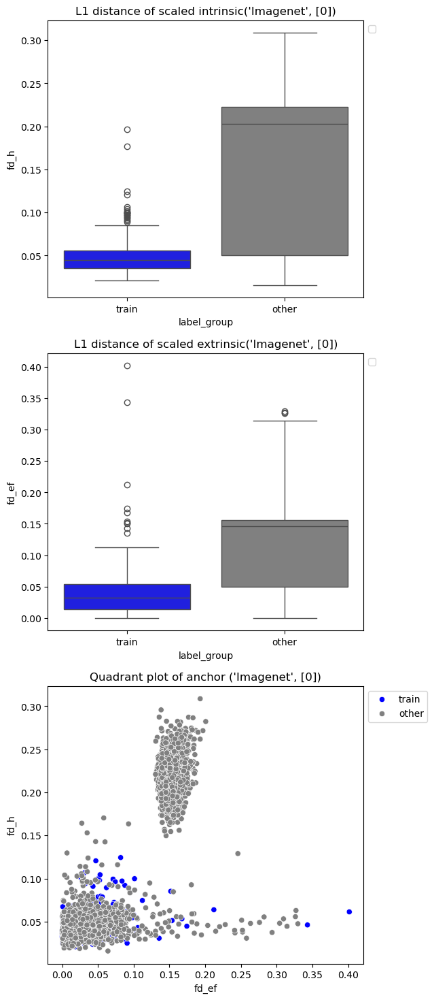

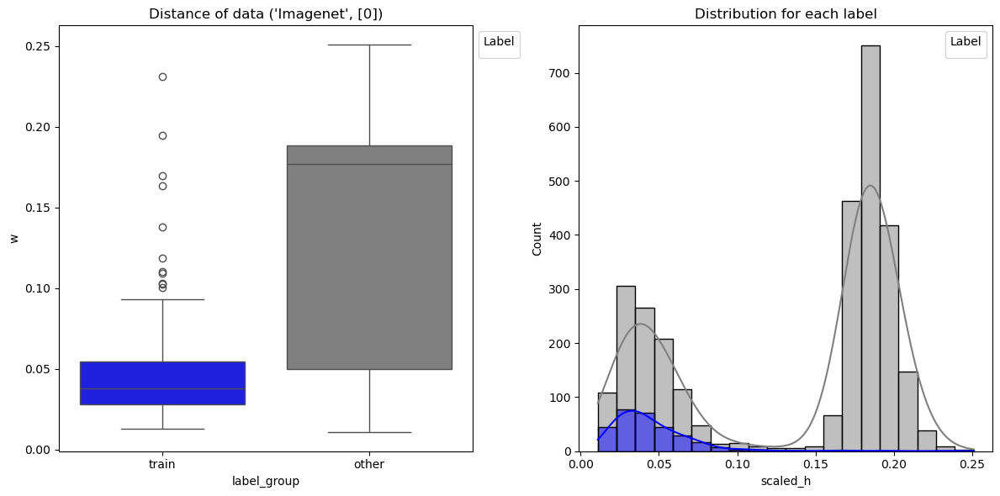

Distance Metric L2 Computing ... start


C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='labe

experiment 2 Done ......


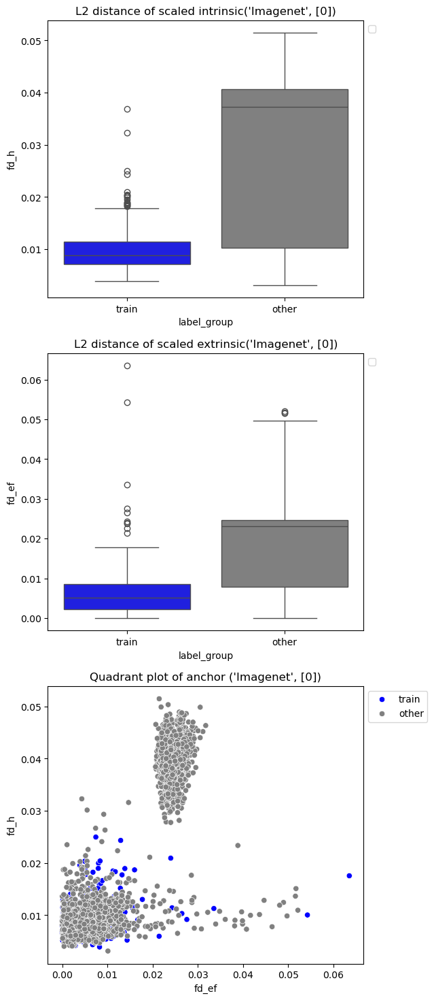

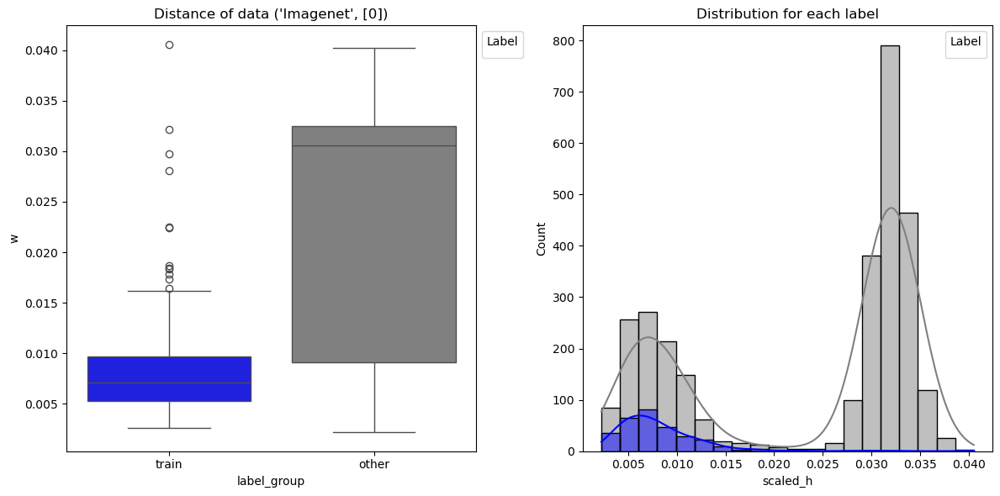

Distance Metric Linf Computing ... start


C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='labe

experiment 2 Done ......


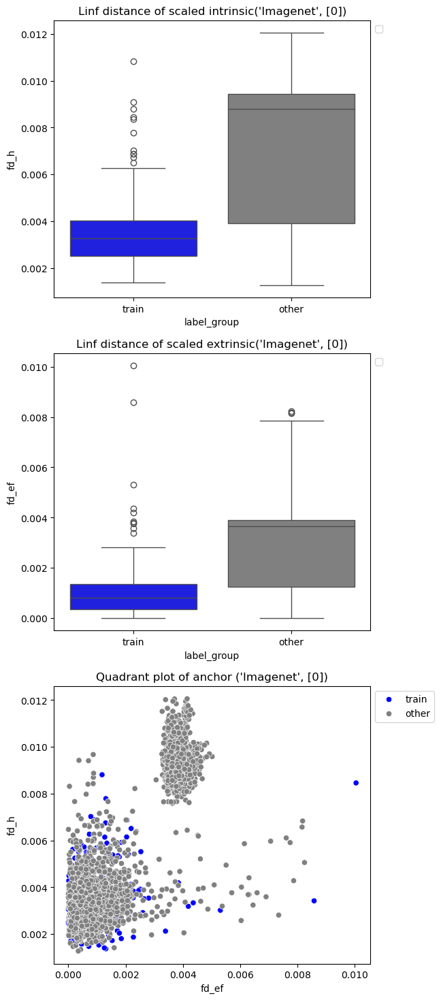

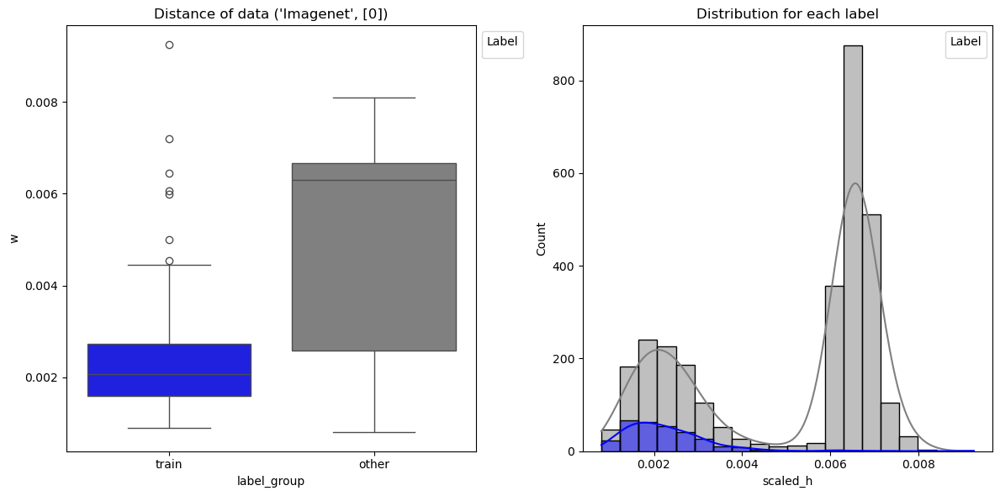

Distance Metric Frechet Computing ... start


C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
C:\Users\user\AppData\Local\Temp\ipykernel_20092\2071421325.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='labe

experiment 2 Done ......


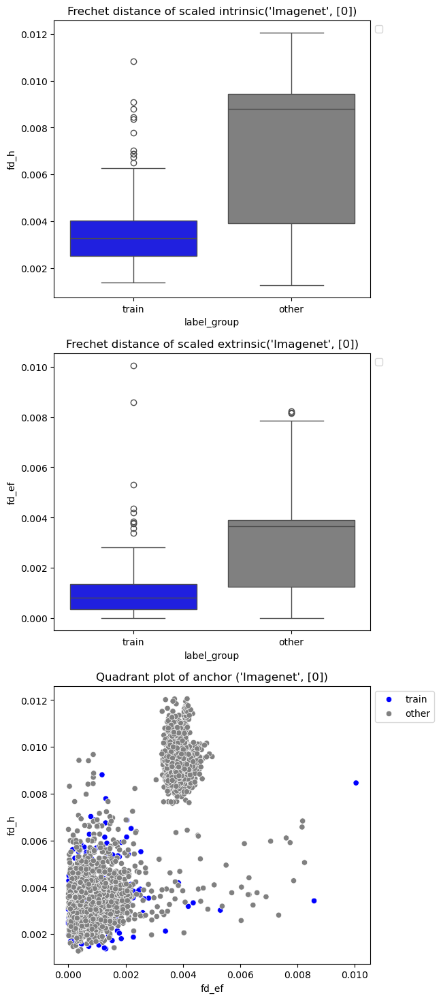

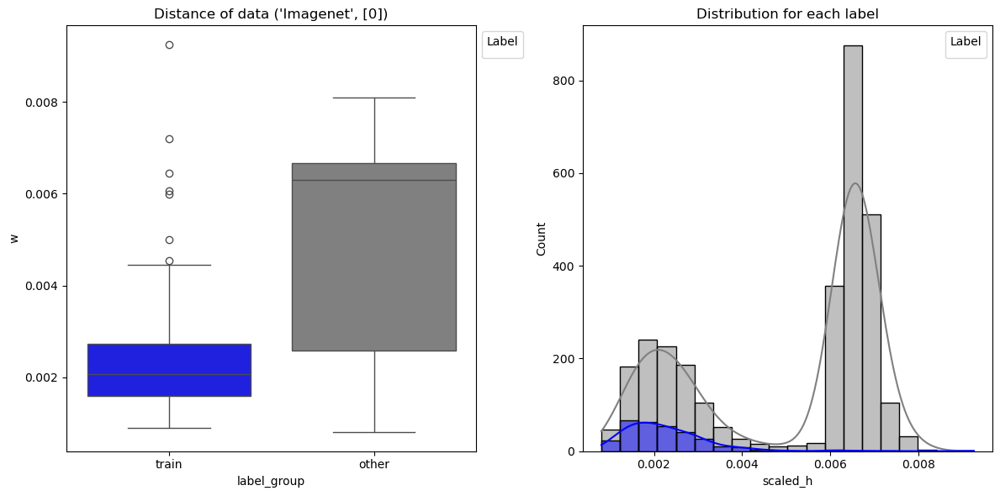

In [21]:
for dis_metric in ['L1', 'L2', 'Linf', 'Frechet']:
    args.metric = dis_metric
    print(f'Distance Metric {args.metric} Computing ... start')
    t_exp2 = t_Experiment_2(args, model_config, df_anchor, metric=args.metric)
    train_mean_anchor = t_exp2.anchor_train_mean_df
    t_exp2.plot_sim()
    #t_exp2.plot_sim_divide_dataset()

    print("experiment 2 Done ......")

    t_exp3 = t_Experiment_3(args, model_config, t_exp2.anchor_train_mean_df, t_exp2.anchor_test_mean_df)
    t_exp3.plot()

In [ ]:
(exp2.e_mean + 2 * exp2.e_var )* 0.5 + (exp2.i_mean + 2 * exp2.i_var) * 0.5

0.28741627126593317

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8545961..0.94661176].


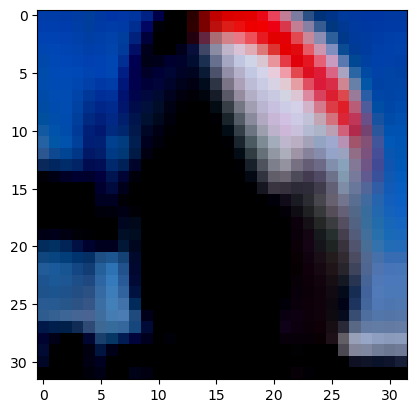

In [4]:
dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)
plt.imshow(train_dataset[12][0].permute(1,2,0))

In [6]:
train_dataset[12][0].shape

torch.Size([3, 32, 32])

In [ ]:
dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


AttributeError: 'Subset' object has no attribute 'to'

In [5]:
for i in range(1):
    args = set_args()
    args.split_class = [i]
    
    seed_everything(args.seed) 


    """Merge both these"""
    model_config = set_config(args, custom_dataset=args.dataset) 
    model, sampler, trainer = model_init(args, model_config)
    
    i_data, e_data = get_sample_h_space_and_xt(args, model_config)
    


Config : MNIST
Config : haha
loading model : 0_ckpt_30_.pt ......


c:\Users\user\Desktop\DDPM_XAI\Utils.py:799: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
update Sampler ...... done
update Trainer ...... done


c:\Users\user\Desktop\DDPM_XAI\Utils.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.


In [ ]:

i_data[0].shape

torch.Size([80, 512, 4, 4])

In [84]:
with torch.no_grad():
    s_size = e_data[0].shape[0]
    e_dis_lst = []
    i_dis_lst = []
    
    for i in range(s_size):
        e_dis = 0
        i_dis = 0
        mse_loss = nn.MSELoss()
        
        for j in range(80):
            train_dt = train_dataset[j][0].to(model_config['device'])
            #for intrinsic_j in [0, 200, 400, 600, 800]:
                #i_dis += mse_loss(i_data[intrinsic_j][i], )
            e_dis += mse_loss(e_data[0][i], train_dt)
        e_dis = e_dis.cpu().numpy()
        e_dis_lst.append(e_dis / 80)
    i_asterisk =  np.argmin(e_dis_lst)
    
    optimal_loss = []
    for round in range(80):
        train_dt = train_dataset[round][0].to(model_config['device'])
        loss = mse_loss(e_data[0][i_asterisk], train_dt)
        optimal_loss.append(loss.cpu().numpy())
    
    mu, sigma = np.mean(optimal_loss), np.var(optimal_loss)


In [15]:
np.argmin([3,4,5,6,1])

4

In [4]:
df_t = exp2.anchor_train_mean_df

In [12]:
df_t.iloc[df_t['fd_h'].idxmin():df_t['fd_h'].idxmin()+1]

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
132,132,train,0.296884,0.327349,0.152711,0.200215


In [14]:
reduced_percentile = 0.04

dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


# Align the number of each group dataset
HIHE_len = len(reduced_sort_idx) * 0.35
subset_size = int(HIHE_len * (reduced_percentile * stage))  # Ensure the same size for all modes

dt = CUSTOM_DATASET(args)
train_dataset, test_dataset = dt.load_dataset()

np.random.choice(len(reduced_sort_idx), int(len(train_dataset) - subset_size))

array([63, 29,  8, ..., 67, 69, 47])

In [ ]:
"""
args.load_different_model = True
modelConfig = set_config(args)

device = torch.device(modelConfig["device"])
model_M = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)
args.rd = int(0)
"""
"""Modify in different enviornment"""
"""
ckpt_M = torch.load(os.path.join(
                modelConfig["save_weight_dir"], 'HIHE_' + modelConfig["test_load_weight"]), map_location=device)
#print(f' {os.path.join(modelConfig["save_weight_dir"], 'HIHE_' + modelConfig["test_load_weight"])}')
model_M.load_state_dict(ckpt_M)
print("model_M load weight done.")
model_M.eval()
sampler_M = GaussianDiffusionSampler(
    model_M, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)

with torch.no_grad():
    model_M.eval()
    noisyImage_M = torch.randn(
    size=[256, 3, 32, 32], device="cuda")
    saveNoisy_M = torch.clamp(noisyImage_M * 0.5 + 0.5, 0, 1)
    sampledImgs_M = sampler(saveNoisy_M)
"""
args.load_different_model = True
args.load_rd_training_checkpoint = 150
modelConfig = set_config(args)

FID_HIHE = []
FID_Other = []
FID_Random = []
FID_rd = []


FID_HIHE_M = []
FID_Other_M = []
FID_Random_M = []
FID_rd_M = []

fid_dt_train = CUSTOM_DATASET(args, split=True)
fid_train_dataset, _ = fid_dt_train.load_dataset(custom_trasform=True)

dt_loader = DataLoader(fid_train_dataset, batch_size=args.batch_size, shuffle=False)

for dt, i in dt_loader:
    break #init dt

real = dt
real_M = torch.Tensor().to(modelConfig["device"])
fake = torch.Tensor().to(modelConfig["device"])

for i in [0,20]:
    for round in range(3):
        args.rd = float(i * 0.05)
        FID_rd.append(int(args.rd)*100)
        FID_rd_M.append(int(args.rd)*100)
        
        for mode in ["HIHE", 'Other', 'Random']:
            args.load_different_model = True
            modelConfig = set_config(args)

            with torch.no_grad():
                device = torch.device(modelConfig["device"])
                model = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                                num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)

                """Modify in different enviornment"""
                ckpt = torch.load(os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"]), map_location=device)
                model_par = os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])
                print(f'Loading : {model_par}')
                model_par = os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])
                print(model_par)
                model.load_state_dict(ckpt)
                #print(f'Loading Model : {os.path.join(
                    #modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])}')
                print("model load weight done.")
                model.eval()
                sampler = GaussianDiffusionSampler(
                    model, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)
                

            args.load_different_model = False

            """
            Some bugs need to be fixed here :
            sampling time became longer after training process.
            after gc.collect() still doesn't work.
            """
            for f_s_round in range(25):
                print(f"Sampling ...... f_s_round : {f_s_round}")
                with torch.no_grad():
                    model.eval()
                    noisyImage = torch.randn(
                    size=[model_config["batch_size"], 3, 32, 32], device="cuda")
                    saveNoisy = torch.clamp(noisyImage * 0.5 + 0.5, 0, 1)
                    sampledImgs = sampler(noisyImage)
                    fake = torch.concat([fake,sampledImgs], dim=0)
                
            if i == 0 and round == 0 and mode == 'HIHE':
                for s_round in range(25):
                    print(f"Sampling ..... round : {s_round}")
                    with torch.no_grad():
                        tmp = sampler(noisyImage)
                        real_M = torch.concat((real_M, tmp), dim=0)
                
            fake = sampledImgs
            fretchet_dist = calculate_fretchet(real,fake,InceptionV3_model) 
            fretchet_dist_M = calculate_fretchet(real_M,fake,InceptionV3_model) 
            print(f'mode : {fretchet_dist}')

            if mode == "HIHE":
                FID_HIHE.append(fretchet_dist)
                FID_HIHE_M.append(fretchet_dist_M)
            if mode == "Other":
                FID_Other.append(fretchet_dist)
                FID_Other_M.append(fretchet_dist_M)
            if mode == "Random":
                FID_Random.append(fretchet_dist)
                FID_Random_M.append(fretchet_dist_M)



Config : haha
Config : haha


C:\Users\user\AppData\Local\Temp\ipykernel_12056\3197012710.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


Loading : Result/CheckpointsMNIST/HIHE_rd0_c0_ckpt_150_.pt
Result/CheckpointsMNIST/HIHE_rd0_c0_ckpt_150_.pt
model load weight done.
Sampling ...... f_s_round : 0
Timestep 999 add to h space information and xt information.
Timestep 998 add to h space information and xt information.
Timestep 997 add to h space information and xt information.
Timestep 996 add to h space information and xt information.
Timestep 995 add to h space information and xt information.
Timestep 994 add to h space information and xt information.
Timestep 993 add to h space information and xt information.
Timestep 992 add to h space information and xt information.
Timestep 991 add to h space information and xt information.
Timestep 990 add to h space information and xt information.
Timestep 989 add to h space information and xt information.
Timestep 988 add to h space information and xt information.
Timestep 987 add to h space information and xt information.
Timestep 986 add to h space information and xt information

In [ ]:
FID_HIHE

[36.99643675567046,
 44.21001332871373,
 40.25780278859452,
 40.02821193129864,
 44.40981058642623,
 39.51864228881317]

In [ ]:
FID_Other

[41.37718901401587,
 43.69138975264626,
 44.324435076036195,
 40.85292802631322,
 42.24844343248128,
 40.98841090023596]

In [ ]:
FID_Random

[44.62403624357805,
 40.47862241864226,
 43.31723566968452,
 41.236070294326964,
 39.68495817972196,
 42.34637282312897]

In [ ]:
FID_rd_M = [0,0,0,7,7, 7]

In [ ]:
#red_percentage = np.array([0, 5, 10, 15, 20, 25, 30]).astype(int)

FID_rec = pd.DataFrame([FID_HIHE, FID_HIHE_M, FID_Other, FID_Other_M, FID_Random, FID_Random_M, FID_rd_M]).T
FID_rec.columns = ['FID_HIHE', 'FID_HIHE_M', 'FID_Other', 'FID_Other_M', 'FID_Random', 'FID_Random_M', 'red_stage']
df_melted = FID_rec.melt(id_vars=["red_stage"], var_name="FID Type", value_name="FID Value")


In [ ]:
df_melted_cmp_original = df_melted[df_melted["FID Type"].isin(["FID_HIHE", "FID_Other", "FID_Random"])]
df_melted_cmp_M = df_melted[df_melted["FID Type"].isin(["FID_HIHE_M", "FID_Other_M", "FID_Random_M"])]


In [ ]:
df_melted_cmp_M

,red_stage,FID Type,FID Value
6,0.0,FID_HIHE_M,25.506344
7,0.0,FID_HIHE_M,26.042951
8,0.0,FID_HIHE_M,27.005411
9,7.0,FID_HIHE_M,28.416227
10,7.0,FID_HIHE_M,27.553745
11,7.0,FID_HIHE_M,26.657147
18,0.0,FID_Other_M,25.912286
19,0.0,FID_Other_M,25.962232
20,0.0,FID_Other_M,23.699602
21,7.0,FID_Other_M,25.490800


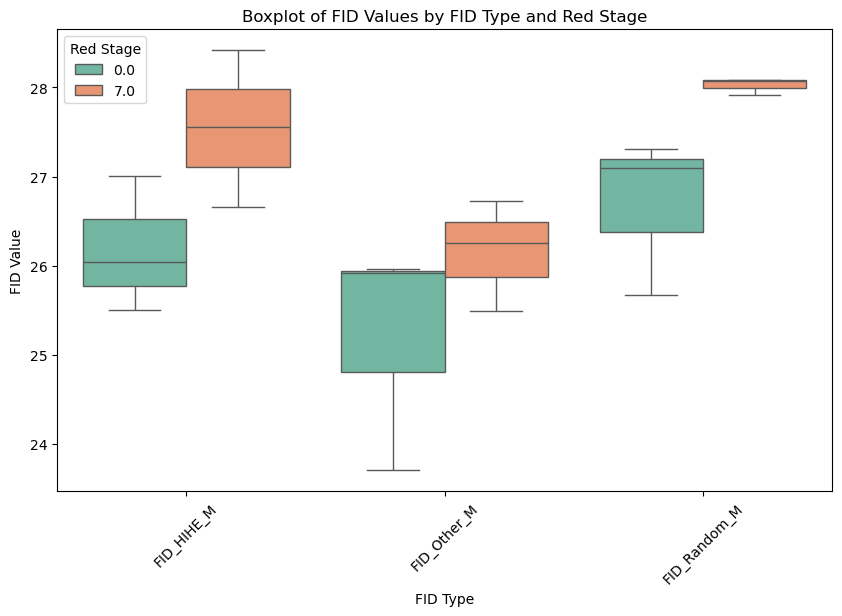

In [ ]:
# Creating the boxplot using seaborn
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df_melted_cmp_M,
    x="FID Type",
    y="FID Value",
    hue="red_stage",
    palette="Set2"
)

plt.title("Boxplot of FID Values by FID Type and Red Stage")
plt.xlabel("FID Type")
plt.ylabel("FID Value")
plt.legend(title="Red Stage")
plt.xticks(rotation=45)
plt.show()


In [14]:
# Create a fancy relplot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_melted_cmp_original, x="red_percentage", y="FID Value", hue="FID Type", marker="o", linewidth=2.5)

# Customize plot aesthetics
plt.xlabel("Red Percentage", fontsize=14, fontweight='bold')
plt.ylabel("FID Values", fontsize=14, fontweight='bold')
plt.title("Relationship between Reduce Percentage and FID Values", fontsize=16, fontweight='bold')
plt.legend(title="FID Type", title_fontsize=12, fontsize=10)
plt.xticks(red_percentage, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Show the plot
plt.show()



ValueError: Could not interpret value `red_percentage` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

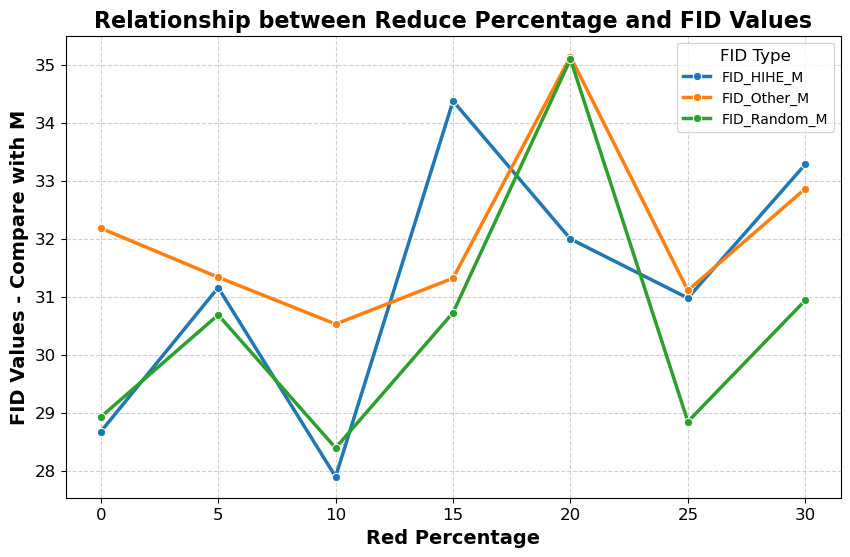

In [7]:
# Create a fancy relplot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_melted_cmp_M, x="red_percentage", y="FID Value", hue="FID Type", marker="o", linewidth=2.5)

# Customize plot aesthetics
plt.xlabel("Red Percentage", fontsize=14, fontweight='bold')
plt.ylabel("FID Values - Compare with M", fontsize=14, fontweight='bold')
plt.title("Relationship between Reduce Percentage and FID Values", fontsize=16, fontweight='bold')
plt.legend(title="FID Type", title_fontsize=12, fontsize=10)
plt.xticks(red_percentage, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Show the plot
plt.show()

In [7]:
#rd_model, rd_sampler, rd_trainer = model_init(args, model_config, rd=True)
#fake = generate_sameple_img(args, model_config, rd_model, rd_sampler)


"""
with torch.no_grad():
    model.eval()
    noisyImage = torch.randn(
    size=[model_config["batch_size"], 3, 32, 32], device="cuda")
    saveNoisy = torch.clamp(noisyImage * 0.5 + 0.5, 0, 1)
    sampledImgs = rd_sampler(noisyImage)
"""
fake = sampledImgs

fid_dt_train = CUSTOM_DATASET(args, split=True)
fid_train_dataset, _ = fid_dt_train.load_dataset(custom_trasform=True)

dt_loader = DataLoader(fid_train_dataset, batch_size=fake.shape[0], shuffle=False)

for dt, i in dt_loader:
    print(dt.shape)
    break

real = dt
fretchet_dist = calculate_fretchet(real,fake,InceptionV3_model) 

KeyboardInterrupt: 

In [6]:
fretchet_dist

69.63400291726376

In [4]:
reduced_percentile = 0.04

dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


# Align the number of each group dataset
HIHE_len = len(reduced_sort_idx) * 0.25
subset_size = int(HIHE_len * (1 - reduced_percentile * stage))  # Ensure the same size for all modes

for reduce_mode in ['HIHE', 'Other', 'Random']:
    #for round in range(10):
    if reduce_mode == 'HIHE':
        reduced_data = Subset(train_dataset, list(reduced_sort_idx[:subset_size]))
    if reduce_mode == 'Other':
        reduced_data = Subset(train_dataset, list(reduced_sort_idx[-subset_size:]))
    if reduce_mode == 'Random':
        random_indices = np.random.choice(len(reduced_sort_idx), subset_size, replace=False)
        random_indices_arr = reduced_sort_idx[random_indices]
        reduced_data = Subset(train_dataset, random_indices_arr)

NameError: name 'reduced_sort_idx' is not defined

In [10]:
reduced_sort_idx

array([ 114, 2956, 2546, ..., 2816, 3405, 3293], dtype=int64)

In [7]:
train_mean_anchor

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
0,0,train,0.221093,0.507086,0.263851,0.389556
1,1,train,0.362980,0.490500,0.198949,0.355486
2,2,train,0.354381,0.485490,0.180239,0.373786
3,3,train,0.306864,0.498539,0.332577,0.380612
4,4,train,0.318964,0.465728,0.180777,0.374146
...,...,...,...,...,...,...
3996,3996,train,0.238334,0.476684,0.235583,0.476311
3997,3997,train,0.279995,0.486525,0.202313,0.392131
3998,3998,train,0.408594,0.509935,0.233167,0.394157
3999,3999,train,0.348559,0.518587,0.250119,0.398875


In [8]:
df_anchor_mean = train_mean_anchor.groupby(['idx'])[['scaled_ef_inversion','scaled_h']].mean().reset_index()
df_anchor_mean['weight'] = (df_anchor_mean['scaled_ef_inversion'] * 0.2 + df_anchor_mean['scaled_h'] * 0.8)
    
df_anchor_mean = df_anchor_mean.sort_values(by='weight')

In [30]:
with torch.no_grad():
    device = torch.device(modelConfig["device"])
    model = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                    num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)

    """Modify in different enviornment"""
    ckpt = torch.load(os.path.join(
        modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"]), map_location=device)
    model.load_state_dict(ckpt)
    #print(f'Loading Model : {os.path.join(
        #modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])}')
    print("model load weight done.")
    model.eval()
    sampler = GaussianDiffusionSampler(
        model, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)
    
    noisyImage_M = torch.randn(
    size=[256, 3, 32, 32], device="cuda")
    saveNoisy_M = torch.clamp(noisyImage_M * 0.5 + 0.5, 0, 1)
    sampledImgs_M = sampler(saveNoisy_M)
    real_M = sampledImgs_M

args.load_different_model = False

C:\Users\user\AppData\Local\Temp\ipykernel_516\2601672158.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
Timestep 999 add to h space information and xt information.
Timestep 998 add to h space information and xt information.
Timestep 997 add to h space information and xt information.
Timestep 996 add to h space information and xt information.
Timestep 995 add to h space information and xt information.
Timestep 994 add to h space information and xt information.
Timestep 993 add to h space information and xt information.
Timestep 992 add to h space information and xt information.
Timestep 991 add to h space information and xt information.
Timestep 990 add to h space information and xt information.
Timestep 989 add to h space information and xt information.
Timestep 988 add to h space information and xt information.
Timestep 987 add to h space information and xt information.
Timestep 986 add to h space information and xt information.
Timestep 985 add to h space information and xt information.
Timestep 984 add to h space information and xt information.
Timestep 983 add

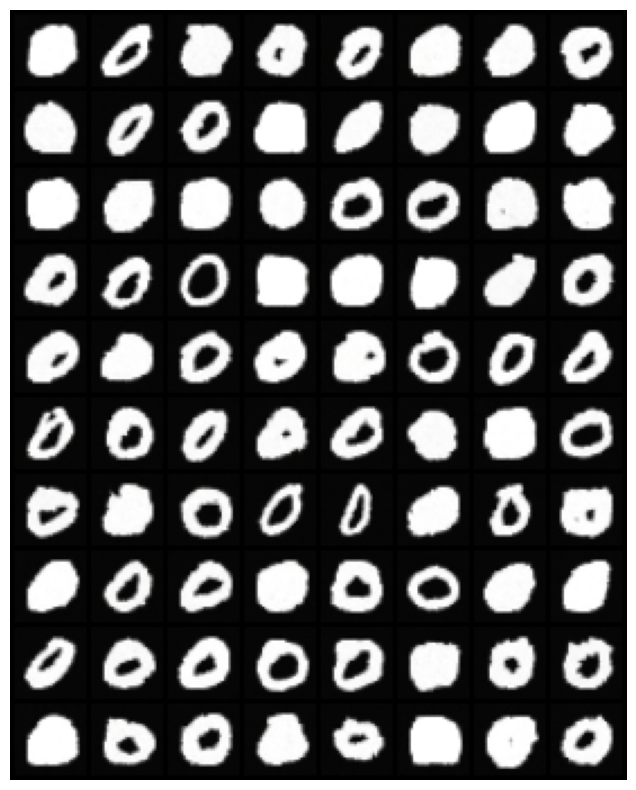

In [47]:
grid = vutils.make_grid(real_M, nrow=8, normalize=True)

# Convert to NumPy for visualization
plt.figure(figsize=(10,10))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())  # Convert from (C, H, W) to (H, W, C)
plt.axis('off')
plt.show()

In [32]:
fretchet_dist_M = calculate_fretchet(real_M,fake,InceptionV3_model) 
print(fretchet_dist_M)

95.85454871111492


In [33]:
os.path.join(
    modelConfig["save_weight_dir"], modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/rd0_c0_ckpt_150_.pt'

In [34]:
os.path.join(
        modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/Random_rd0_c0_ckpt_150_.pt'

In [37]:
os.path.join(
                modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/Random_rd0_c0_ckpt_150_.pt'

In [4]:
real_M.shape

torch.Size([80, 3, 32, 32])

In [23]:
tmp = torch.concat((tmp, real_M), dim=0)

In [24]:
tmp.shape

torch.Size([80, 3, 32, 32])

In [21]:
tmp = torch.Tensor().to(device)

In [22]:
tmp

tensor([], device='cuda:0')